In [8]:
import numpy as np
import nibabel as nib
import matplotlib.pyplot as plt
import cv2

def load_nii(filepath: str) -> np.ndarray:
    """
    Loads the contents of a nii.gz into memory.
    """
    img = nib.load(filepath).get_fdata()
    return np.array(img)

def auto_contrast(data: np.ndarray, alpha: float = None, beta: float = None) -> np.ndarray:
    """
    Preprocess tiff files to automatically adjust brightness and contrast.
    https://stackoverflow.com/questions/56905592/automatic-contrast-and-brightness-adjustment-of-a-color-photo-of-a-sheet-of-pape
    """
    if not alpha:
        alpha = np.iinfo(data.dtype).max / (np.max(data) - np.min(data))
    if not beta:
        beta = -np.min(data) * alpha
    img = cv2.convertScaleAbs(data.copy(), alpha=alpha, beta=beta)
    return img

[[ 278. 5422. 5868.]
 [ 278. 5426. 5887.]
 [ 278. 5434. 5916.]
 [ 278. 5667. 6689.]]


(280, 436, 562)


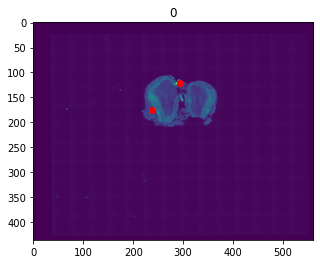

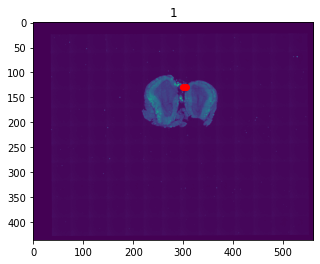

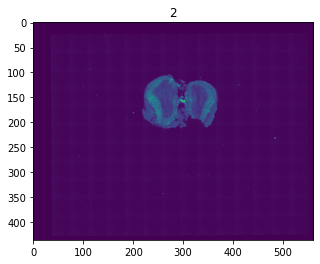

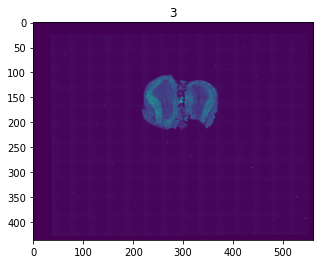

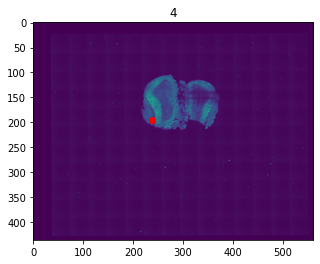

...

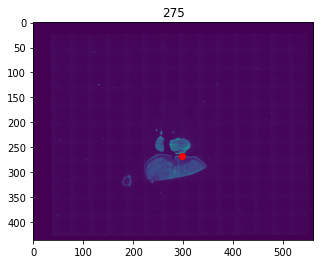

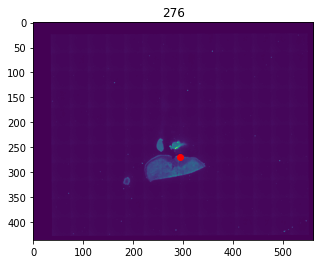

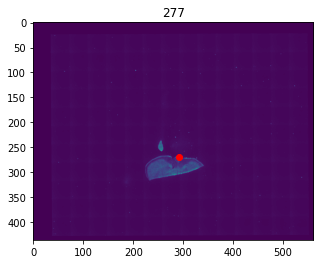

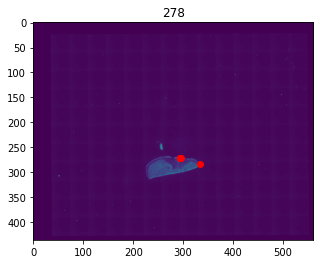

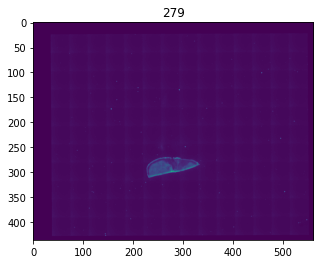

ValueError: operands could not be broadcast together with shapes (6991,3) (2,) 

In [18]:
input_points_file = "../B0039/counting/inputpoints_scaled.txt"
nii_path = "../B0039/nii/brain_25.nii.gz"
tif_folder_path = "../B0039/"
output_points_file = "../B0039/counting/rotated_inputpoints.txt"

# Load points from file
points = np.loadtxt(input_points_file, skiprows=2)

# Load nii file
brain25 = load_nii(nii_path)

print(brain25.shape)

for idx in range(brain25.shape[0]):
    matching_points = points[points[:, 0] == idx]
    for pt in matching_points:
        plt.plot(pt[2], pt[1], 'ro')
    plt.title(str(idx))
    plt.imshow(auto_contrast(brain25[idx, :, :], alpha=0.3))
    plt.show()

# Define rotation matrix for 90 degree rotation
rotation_matrix = np.array([[0, -1], [1, 0]])

# Define resolution
resolution = np.array([436, 562])

# Adjust points for change in origin and rotate
rotated_points = np.dot(points - resolution / 2, rotation_matrix) + resolution / 2

# Save rotated points to file
np.savetxt(output_points_file, rotated_points, "%d %d %d", 
           header = "index\n" + str(rotated_points.shape[0]), 
           comments = "")
